In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
from torch.utils.data import DataLoader
import os
import argparse

from sam_whistle.dataset import WhistleDataset
from sam_whistle.config import Args
from sam_whistle import utils
%load_ext autoreload
%autoreload 2

In [2]:
args = Args()
dataset = WhistleDataset(args, 'train')
dataloader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=os.cpu_count(),)

(769, 1500, 3)


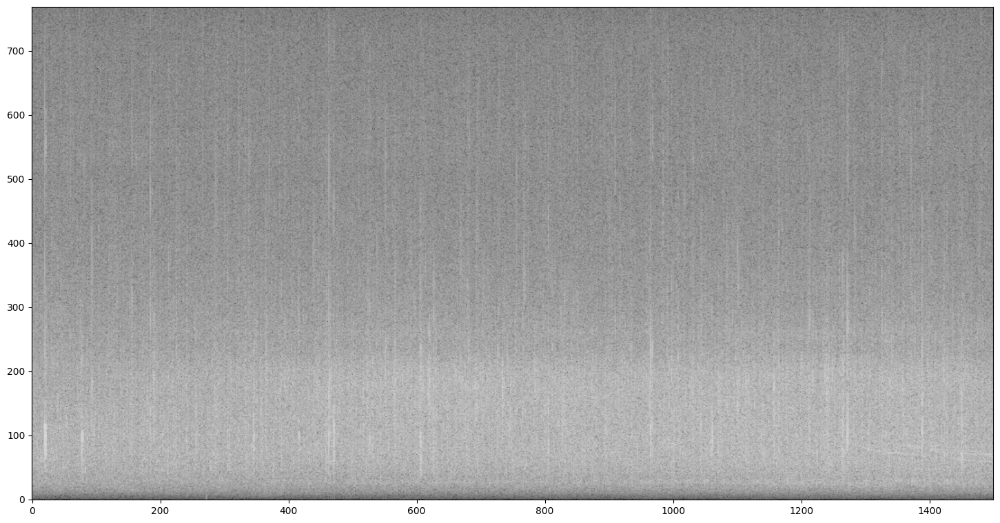

In [3]:
data = dataset[0]
spect, bboxes, contours, gt_mask, points_prompt= data
height, width, _ = spect.shape
print(spect.shape)
fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
utils.show_spect(spect, fig, save = '../imgs/test.png')

In [4]:
from segment_anything import sam_model_registry, SamPredictor
sam_checkpoint = "../checkpoints/sam_vit_h_4b8939.pth"
model_type = "vit_h"
device = "cuda"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
predictor = SamPredictor(sam)
predictor.set_image(spect)

../checkpoints/sam_vit_h_4b8939.pth


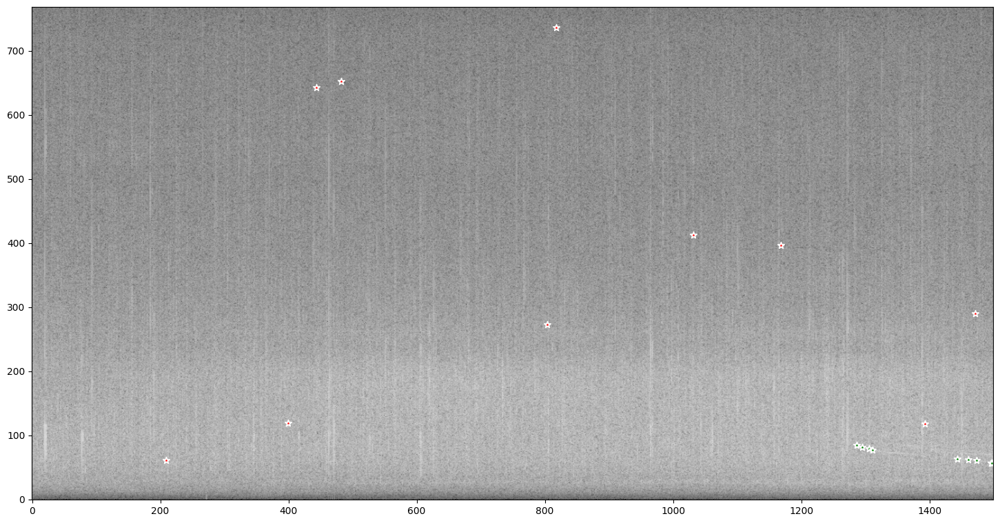

In [5]:
# prompts = utils.get_point_prompts(data, n_pos=8, box_pad= 5)
prompts = points_prompt
points, labels = prompts
fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
utils.show_spect(spect, fig)
utils.show_points(points, labels, ax, shape=spect.shape[:2])
fig.savefig('../imgs/test_points.png',bbox_inches='tight')

[[1295  687]
 [1460  707]
 [1498  712]
 [1306  690]
 [1496  712]
 [1497  712]
 [1311  692]
 [1443  706]
 [1286  684]
 [1473  708]
 [ 443  126]
 [1393  651]
 [ 482  117]
 [ 209  708]
 [ 399  650]
 [ 818   33]
 [ 804  496]
 [1471  479]
 [1168  372]
 [1031  356]]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
(1, 769, 1500) (1,) (1, 256, 256)


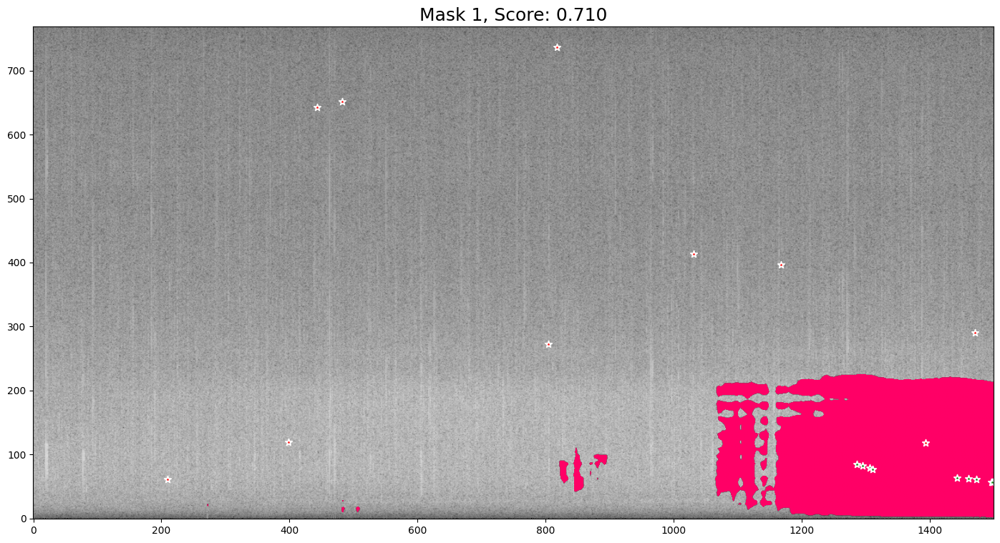

In [6]:
# for i in range(50):
#     if i == 0:
#         mask_input = None
#     else:
#         mask_input = logits[np.argmin(scores)] 
#         mask_input=mask_input[None, :, :]

#     masks, scores, logits  = predictor.predict(
#         point_coords=points,
#         point_labels=labels,
#         # box=input_box,
#         mask_input=mask_input,
#         multimask_output=True,
#     )
print(points)
print(labels)
np.save('../imgs/test_points.npy', points)
masks, scores, logits  = predictor.predict(
    point_coords=points,
    point_labels=labels,
    # box=input_box,
    # mask_input=mask_input,
    multimask_output=False,
)

print(masks.shape, scores.shape, logits.shape)
for i, (mask, score) in enumerate(zip(masks, scores)):
    fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    utils.show_spect(spect, fig)
    utils.show_mask(mask, ax)
    utils.show_points(points, labels, ax, shape=spect.shape[:2])
    fig.savefig(f'../imgs/test_mask_{i}.png',bbox_inches='tight')

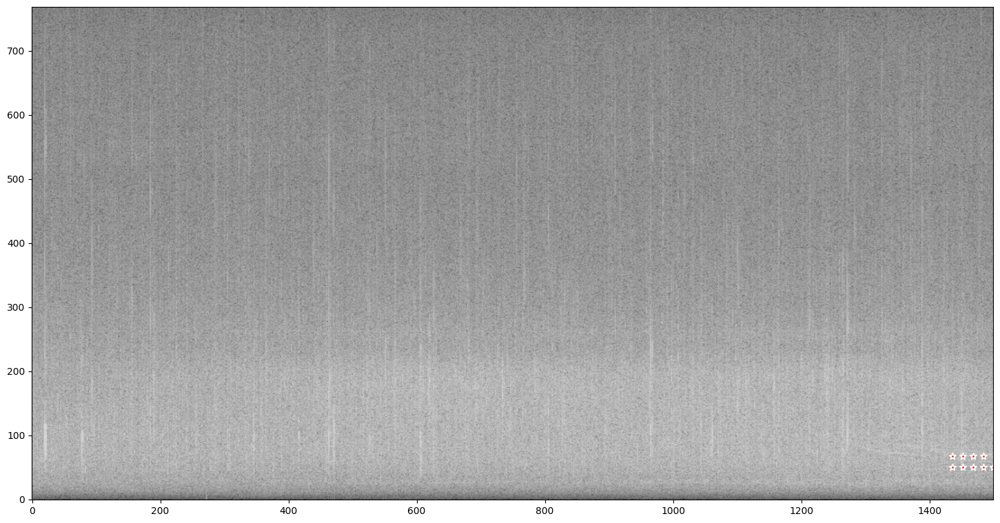

In [8]:
prompts = utils.get_point_prompts(data, n_pos=8, box_pad= 5)
points, labels = prompts[1]
# print(points.shape, labels.shape)
# print(points, labels)

fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
utils.show_spect(spect, fig)
utils.show_points(points[8:], labels[8:], ax, shape=spect.shape[:2])
fig.savefig('../imgs/test_points2.png',bbox_inches='tight')

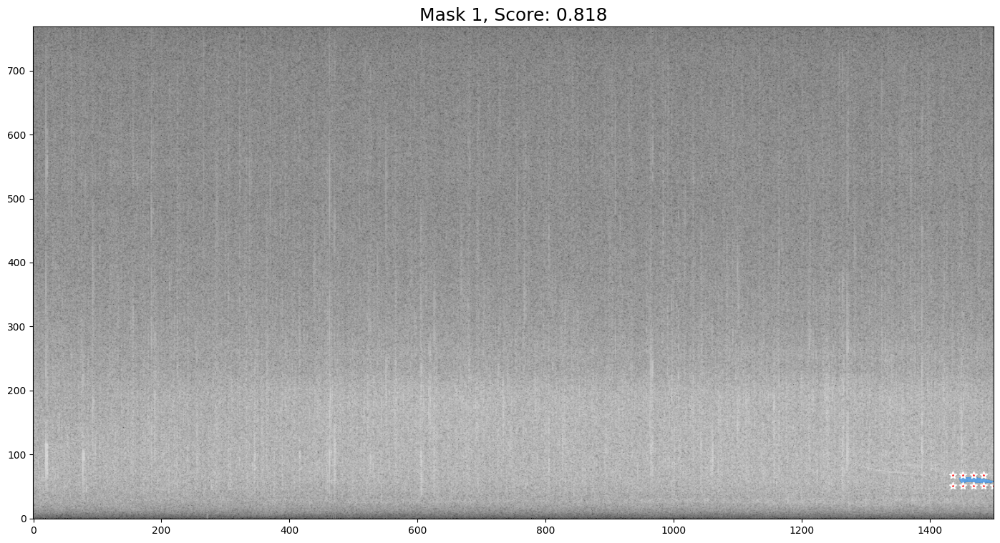

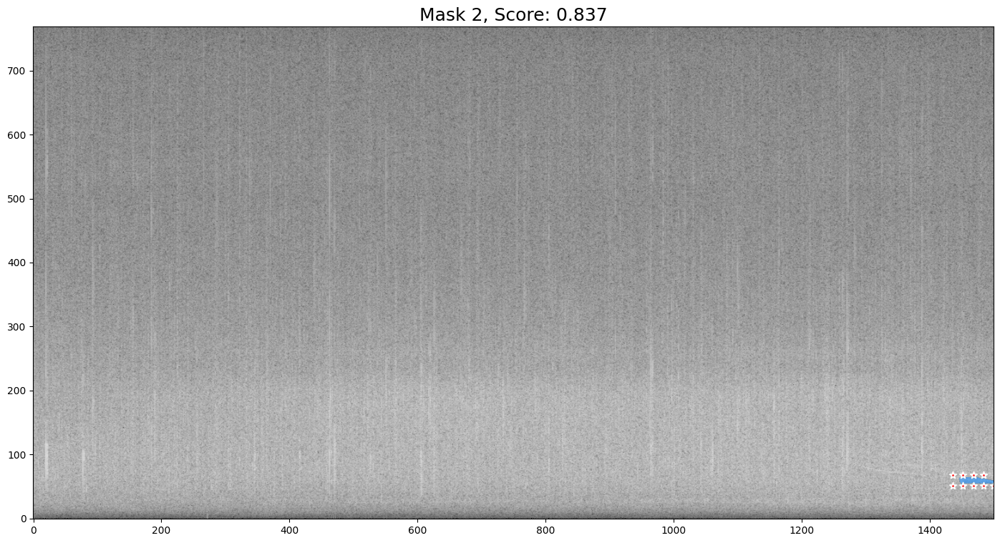

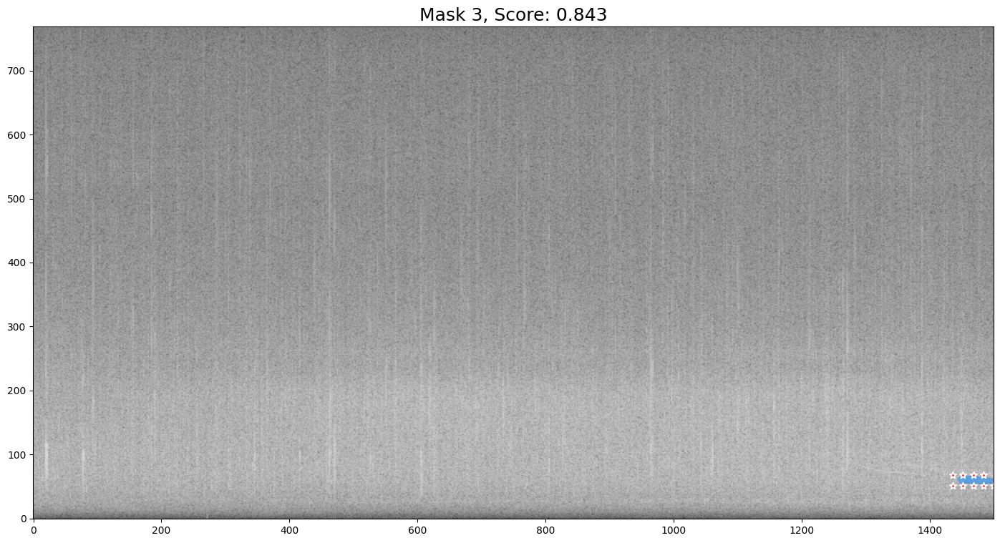

In [9]:
for i in range(50):
    if i == 0:
        mask_input = None
    else:
        mask_input = logits[np.argmin(scores), :, :] 
        mask_input=mask_input[None, :, :]

    masks, scores, logits  = predictor.predict(
        point_coords=points,
        point_labels=labels,
        # box=input_box,
        mask_input=mask_input,
        multimask_output=True,
    )

for i, (mask, score) in enumerate(zip(masks, scores)):
    fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    utils.show_spect(spect, fig)
    utils.show_mask(mask, ax)
    utils.show_points(points[8:], labels[8:], ax, shape=spect.shape[:2])
    fig.savefig(f'../imgs/test_mask_{i}.png',bbox_inches='tight')

# multiple whistle mask

(769, 1500, 3)


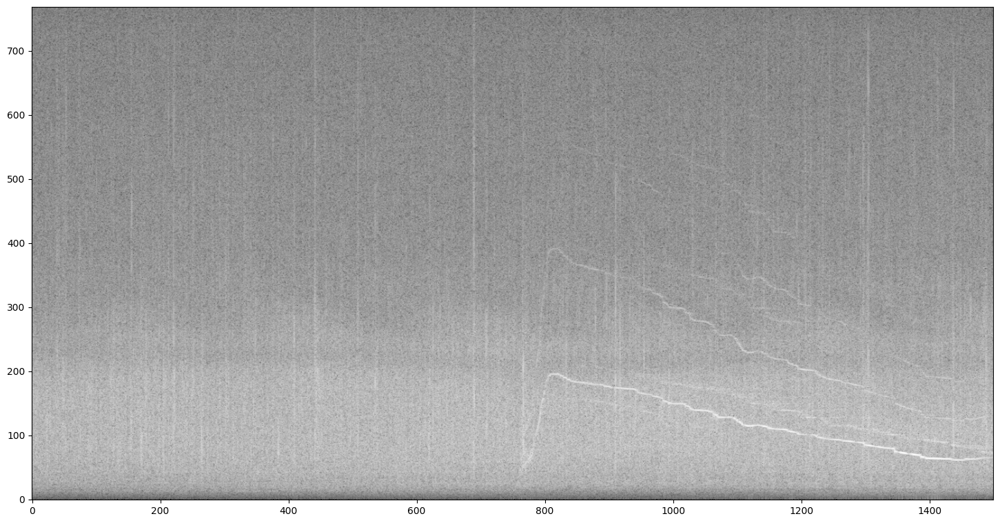

In [22]:
data = dataset[4]
spect, bboxes, contours = data
height, width, _ = spect.shape
print(spect.shape)
fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
# for contour in contours:
#     contour = np.array(contour)
#     x = np.minimum(contour[:, 0], width-1)
#     y = np.minimum(contour[:, 1], height-1) 
#     c = (np.random.rand(3)*0.6 + 0.4).tolist()
#     ax.scatter(x, height- y, color=c, s=1)
utils.show_spect(spect, fig, save = '../imgs/test.png')
fig.savefig('../imgs/test.png',bbox_inches='tight')

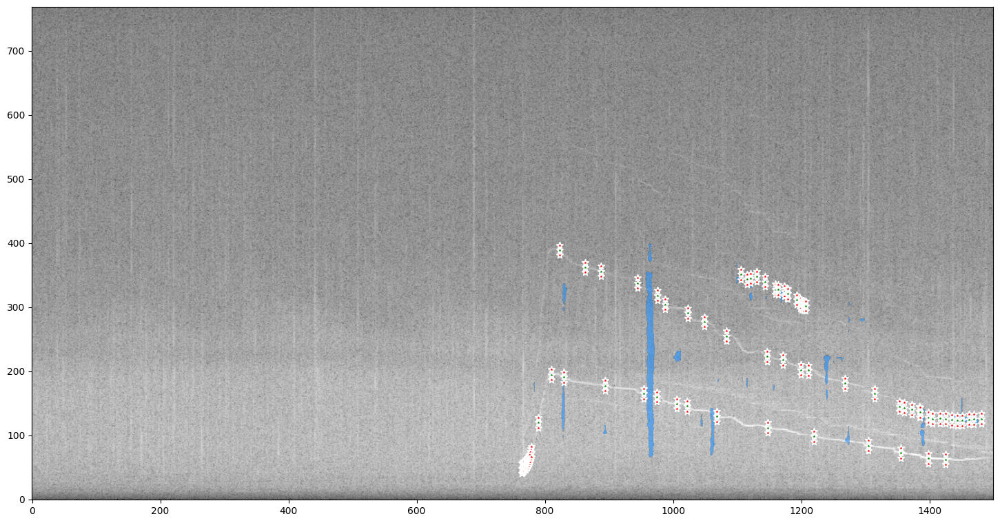

In [23]:
n_pos, n_neg, pad = 15, 15, 5
promts = utils.get_point_prompts(data, n_pos, n_neg, thickness=8)
fig, ax = plt.subplots(figsize=(width / 100, height / 100), dpi=100)
utils.show_spect(spect, fig)
pseudo_masks = []
for p in range(len(promts)):
    points, labels = promts[p]
    for i in range(10):
        if i == 0:
            mask_input = None
        else:
            mask_input = logits[np.argmin(scores)] 
            mask_input=mask_input[None, :, :]

        masks, scores, logits  = predictor.predict(
            point_coords=points,
            point_labels=labels,
            mask_input=mask_input,
            multimask_output=True,
        )
    pseudo_masks.append(masks[np.argmin(scores)])
    utils.show_points(points, labels, ax, shape=spect.shape[:2])
pseudo_mask = utils.combine_masks(pseudo_masks)
utils.show_mask(pseudo_mask, ax)
